In [1]:
import pandas as pd
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import datetime
from tqdm.auto import tqdm
import warnings
warnings.filterwarnings('ignore')
plt.style.use('ggplot')
%matplotlib inline

In [5]:
!head -n 5 ../data/01.csv 
!pwd

xField[m],yField[m]
0.000000,72.000000
0.000000,0.000000
118.000000,0.000000
118.000000,72.000000
/mnt/d/xFootball/JCI/jci_iot/notebooks


In [6]:
data = pd.DataFrame()
for file_ in glob.glob('../data/*.csv'):
    df = pd.read_csv(file_,skiprows=5)
    df['playerid'] = file_[-6:-4]
    data = pd.concat([data,df])
    print (f"{file_}: {df.shape[0]} rows | data: {data.shape[0]} rows")
print (data.shape)

../data/01.csv: 59551 rows | data: 59551 rows
../data/02.csv: 59331 rows | data: 118882 rows
../data/05.csv: 59607 rows | data: 178489 rows
../data/07.csv: 59576 rows | data: 238065 rows
../data/08.csv: 54859 rows | data: 292924 rows
../data/09.csv: 59622 rows | data: 352546 rows
../data/10.csv: 59494 rows | data: 412040 rows
../data/12.csv: 59365 rows | data: 471405 rows
../data/16.csv: 23710 rows | data: 495115 rows
(495115, 10)


In [7]:
data['datetime'] = data["time[ISO-UTC]"].apply(lambda x: pd.to_datetime(f"{x.replace('T','')[:-3]}.{x[-3:]}", format= "%Y%m%d%H%M%S.%f"))
data['t'] = data['datetime'].dt.time

In [8]:
data.head(20)

,time[ISO-UTC],xPos[m],yPos[m],Latitude[deg],Longitude[deg],speed[km/h],hr[bpm],numSatFix[-],hdop[-],playerid,datetime,t
0,20181031T183138000,45.187631,26.145418,46.371289,6.228680,0.32184,160.0578,NaN,NaN,01,2018-10-31 18:31:38.000,18:31:38
1,20181031T183138100,45.112052,26.097923,46.371288,6.228680,0.63000,160.0578,NaN,NaN,01,2018-10-31 18:31:38.100,18:31:38.100000
2,20181031T183138200,45.032956,26.057272,46.371287,6.228680,0.94680,160.0578,NaN,NaN,01,2018-10-31 18:31:38.200,18:31:38.200000
3,20181031T183138300,44.967264,26.014859,46.371286,6.228680,1.22724,160.0578,NaN,NaN,01,2018-10-31 18:31:38.300,18:31:38.300000
4,20181031T183138400,44.902237,25.946833,46.371285,6.228680,1.53432,160.0578,NaN,NaN,01,2018-10-31 18:31:38.400,18:31:38.400000
5,20181031T183138500,44.830840,25.866882,46.371285,6.228681,1.87344,160.0578,NaN,NaN,01,2018-10-31 18:31:38.500,18:31:38.500000
6,20181031T183138600,44.769330,25.792012,46.371284,6.228681,2.19636,160.0578,NaN,NaN,01,2018-10-31 18:31:38.600,18:31:38.600000
7,20181031T183138700,44.728259,25.701692,46.371283,6.228682,2.52396,160.0578,NaN,NaN,01,2018-10-31 18:31:38.700,18:31:38.700000
8,20181031T183138800,44.660379,25.614897,46.371282,6.228683,2.86236,159.8115,NaN,NaN,01,2018-10-31 18:31:38.800,18:31:38.800000
9,20181031T183138900,44.598869,25.540027,46.371281,6.228683,3.19536,159.8115,NaN,NaN,01,2018-10-31 18:31:38.900,18:31:38.900000


# rough explore

In [57]:
time_taken = (data['dt'].iloc[1] -data['dt'].iloc[0]).total_seconds() # seconds
data['speed[m/s]'] = data["speed[km/h]"]/3.6
data['acc[m/s2]_pseudo'] = data["speed[m/s]"]/time_taken
data['distance[m]'] = data['speed[m/s]']*time_taken
data['speed>15km/h'] = (data["speed[km/h]"]>15).astype(int)
data['speed@15-20'] = (data["speed[km/h]"].between(15, 19, inclusive = True)).astype(int)
data['speed@20-25'] = (data["speed[km/h]"].between(20, 24, inclusive = True)).astype(int)
data['speed@25-30'] = (data["speed[km/h]"].between(25, 30, inclusive = True)).astype(int)
data['speed>30km/h'] = (data["speed[km/h]"]>30).astype(int)
data['sprint'] = (data["speed[km/h]"]>25).astype(int)


In [59]:
data.groupby(['source']).sum()

,xPos[m],yPos[m],Latitude[deg],Longitude[deg],speed[km/h],hr[bpm],numSatFix[-],hdop[-],speed[m/s],acc[m/s2]_pseudo,distance[m],speed>15km/h,speed@15-20,speed@20-25,speed@25-30,speed>30km/h
source,,,,,,,,,,,,,,,,
01,3.600073e+06,1.908382e+06,2.761465e+06,370925.454366,358558.35192,8.872541e+06,0.0,0.0,99599.5422,995995.422,9959.95422,3800,2700,615,104,0
02,3.597196e+06,2.179424e+06,2.751265e+06,369551.987882,332695.63512,6.902831e+06,0.0,0.0,92415.4542,924154.542,9241.54542,1759,1337,232,31,0
05,3.620877e+06,2.204788e+06,2.764063e+06,371270.960171,333380.10492,8.505887e+06,0.0,0.0,92605.5847,926055.847,9260.55847,2195,1657,324,29,0
07,3.629016e+06,2.259727e+06,2.762626e+06,371077.282370,402590.17296,7.613033e+06,0.0,0.0,111830.6036,1118306.036,11183.06036,4005,3022,564,61,22
08,3.135266e+06,2.263218e+06,2.543891e+06,341693.469780,274384.49868,8.080629e+06,0.0,0.0,76217.9163,762179.163,7621.79163,2219,1365,450,104,25
09,3.540148e+06,2.400522e+06,2.764759e+06,371361.648230,361417.94244,7.768849e+06,0.0,0.0,100393.8729,1003938.729,10039.38729,4184,2269,1121,244,0
10,3.496556e+06,2.166318e+06,2.758822e+06,370566.819205,420521.03856,9.495369e+06,0.0,0.0,116811.3996,1168113.996,11681.13996,4579,2731,924,301,63
12,3.582973e+06,2.234882e+06,2.752842e+06,369763.037072,386433.62928,7.767619e+06,0.0,0.0,107342.6748,1073426.748,10734.26748,3293,2426,534,10,4
16,1.405030e+06,1.115086e+06,1.099468e+06,147678.259404,153259.50096,2.054641e+06,0.0,0.0,42572.0836,425720.836,4257.20836,1092,846,159,0,0


In [26]:
(data.iloc[1,-1] -data.iloc[0,-1]).total_seconds()
metres/100ms*1000ms=m/s
1000/3600
5 m/s = 5/1000 km/s = 5/1000*3600 km/h = 5*3.6 km/h
5m/100ms = 5/1000 km/100ms = 5/1000*10 km/s = 5/1000*10*3600 km/h = 5*36 km/h

0.1

In [43]:
'dist moved (m)',((45.112052-45.187631)**2+(26.097923-26.145418)**2)**0.5
# 'at speed (m/s)',((45.112052-45.187631)**2+(26.097923-26.145418)**2)**0.5/0.1
# 'at speed km/h)',3.6*((45.112052-45.187631)**2+(26.097923-26.145418)**2)**0.5/0.1

('dist moved (m)', 0.08926343185202162)

In [42]:
0.1*0.32184/3.6
# s * m/s


0.008940000000000002

In [20]:
player = data.query('source=="02"')
player['distance_m'] = 
player.head()

,time[ISO-UTC],xPos[m],yPos[m],Latitude[deg],Longitude[deg],speed[km/h],hr[bpm],numSatFix[-],hdop[-],source,dt
0,20181031T183138000,45.187631,26.145418,46.371289,6.22868,0.32184,160.0578,NaN,NaN,02,2018-10-31 18:31:38.000
1,20181031T183138100,45.112052,26.097923,46.371288,6.22868,0.63000,160.0578,NaN,NaN,02,2018-10-31 18:31:38.100
2,20181031T183138200,45.032956,26.057272,46.371287,6.22868,0.94680,160.0578,NaN,NaN,02,2018-10-31 18:31:38.200
3,20181031T183138300,44.967264,26.014859,46.371286,6.22868,1.22724,160.0578,NaN,NaN,02,2018-10-31 18:31:38.300
4,20181031T183138400,44.902237,25.946833,46.371285,6.22868,1.53432,160.0578,NaN,NaN,02,2018-10-31 18:31:38.400


In [68]:
player.dt.diff()

0                   NaT
1       00:00:00.100000
2       00:00:00.100000
3       00:00:00.100000
4       00:00:00.100000
              ...      
59546   00:00:00.100000
59547   00:00:00.100000
59548   00:00:00.100000
59549   00:00:00.100000
59550   00:00:00.100000
Name: dt, Length: 59551, dtype: timedelta64[ns]

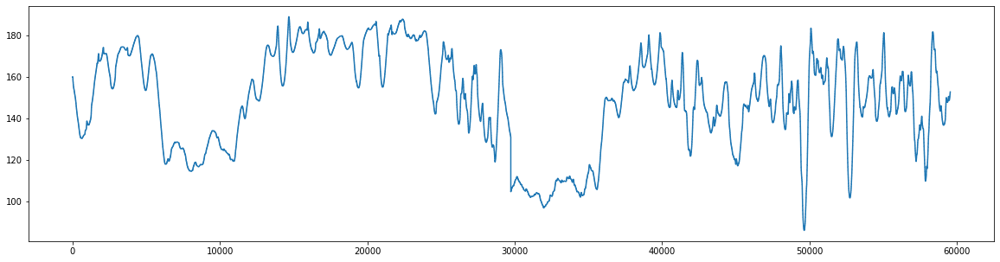

In [62]:
data.query("source=='01'")["hr[bpm]"].plot(figsize=(20,5))

In [ ]:
distance covered
sprint count
sprint freq
speed bands
hr bands: 116-123/132-153/154-175/176-187
    time spent in the following intensity
categories: ,70%, 70–85%, 85–90%, 90–95% and .95% of
the HRmax

distances covered in each speed band -> high intensity if > 15 km/h
heatmap of HR bands and speed bands
speed v HR scatter

pitch plot with slider. as you slide, you can see HR changing, entering bands. also speed charts.
view 1 - overview (all players)
view 2 - select player
view 3 - compare p1 and p2


In [60]:
x = pd.to_datetime(f"{data.iloc[12,0].replace('T','')[:-3]}.{data.iloc[12,0][-3:]}", format= "%Y%m%d%H%M%S.%f")

x.dt.total_seconds()


AttributeError: 'Timestamp' object has no attribute 'dt'

In [25]:
pd.to_datetime(data.iloc[1,0].replace('T','')[:-3], format= "%Y%m%d%H%M%S")

Timestamp('2018-10-31 18:31:38')

In [101]:
data.head(5)


,time[ISO-UTC],xPos[m],yPos[m],Latitude[deg],Longitude[deg],speed[km/h],hr[bpm],numSatFix[-],hdop[-],source,dt,speed[m/s],acc[m/s2]_pseudo,distance[m],speed>15km/h,speed@15-20,speed@20-25,speed@25-30,speed>30km/h
0,20181031T183138000,45.187631,26.145418,46.371289,6.22868,0.32184,160.0578,NaN,NaN,01,2018-10-31 18:31:38.000,0.0894,0.894,0.00894,0,0,0,0,0
1,20181031T183138100,45.112052,26.097923,46.371288,6.22868,0.63000,160.0578,NaN,NaN,01,2018-10-31 18:31:38.100,0.1750,1.750,0.01750,0,0,0,0,0
2,20181031T183138200,45.032956,26.057272,46.371287,6.22868,0.94680,160.0578,NaN,NaN,01,2018-10-31 18:31:38.200,0.2630,2.630,0.02630,0,0,0,0,0
3,20181031T183138300,44.967264,26.014859,46.371286,6.22868,1.22724,160.0578,NaN,NaN,01,2018-10-31 18:31:38.300,0.3409,3.409,0.03409,0,0,0,0,0
4,20181031T183138400,44.902237,25.946833,46.371285,6.22868,1.53432,160.0578,NaN,NaN,01,2018-10-31 18:31:38.400,0.4262,4.262,0.04262,0,0,0,0,0


In [97]:
player_ids = data.source.unique()
maxspeed = 12
speeds = pd.DataFrame()
for player in player_ids:
    player_data = data.query('source==@player')
    dt = player_data['dt'].diff().apply(lambda x: x.total_seconds()).fillna(method='bfill')
    
    vx = player_data["xPos[m]"].diff() / dt # [m/s]
    vy = player_data["yPos[m]"].diff() / dt # [m/s]
    
    if maxspeed > 0:
        # remove unsmoothed data points that exceed the maximum speed (these are most likely position errors)
        raw_speed = np.sqrt(vx ** 2 + vy ** 2)
        vx[raw_speed > maxspeed] = np.nan
        vy[raw_speed > maxspeed] = np.nan
    
    raw_speed = np.sqrt(vx ** 2 + vy ** 2)
    player_data["speed[m/s]"] = raw_speed
    speeds[player] = player_data["speed[m/s]"]
    


/home/opunsoars/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [106]:
0.889308 *3.6

3.2015088

In [100]:
speeds

,01,02,05,07,08,09,10,12,16
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.892634,0.405609,0.941091,0.701408,0.846435,2.026442,0.076952,1.711242,1.528109
2,0.889308,0.671429,1.333105,0.800974,1.636283,2.155292,0.135204,1.216796,1.468328
3,0.781940,0.811218,1.202316,0.509172,1.478836,2.404609,0.111166,1.602507,1.456453
4,0.941066,0.540806,0.601858,0.405601,2.104227,2.666163,0.135197,1.629665,1.518750
...,...,...,...,...,...,...,...,...,...
59546,0.444359,NaN,0.451270,0.076948,NaN,0.875148,NaN,NaN,NaN
59547,0.400472,NaN,0.561137,0.076948,NaN,0.846431,NaN,NaN,NaN
59548,0.327243,NaN,0.342270,0.076952,NaN,1.000326,NaN,NaN,NaN
59549,0.230848,NaN,0.451270,0.076948,NaN,0.777465,NaN,NaN,NaN


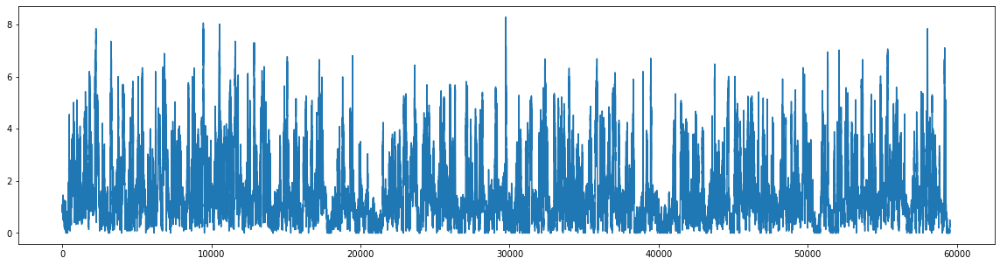

In [105]:
speeds['01'].plot(figsize=(20,5))

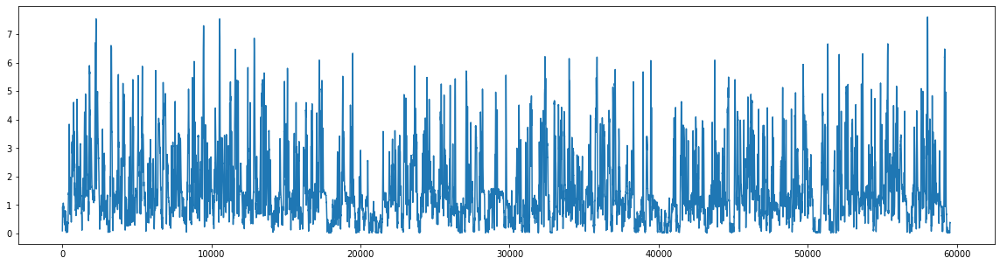

In [104]:
data.query("source=='01'")["speed[m/s]"].plot(figsize=(20,5))

In [133]:
# Calculate some simple measures (distance covered, high speed distance,
# distance covered in high acceleration/deceleration, # of accelerations/decelerations, what is in Laurie's code)

# Total Distance
home_summary = pd.DataFrame(index=player_ids)

minutes_home = []
for player in player_ids:
    player_data = data.query('source==@player')
    player_minutes = ( player_data['dt'].iloc[-1] - player_data['dt'].iloc[0] ).total_seconds() / 60. # convert to minutes
    # search for first and last frames that we have a position observation for each player (when a player is not on the pitch positions are NaN)
#     column = 'Home_' + player + '_x' # use player x-position coordinate
#     player_minutes = ( tracking_home[column].last_valid_index() - tracking_home[column].first_valid_index() + 1 ) / 25 / 60. # convert to minutes
    minutes_home.append( player_minutes )
home_summary['Minutes Played'] = minutes_home
home_summary = home_summary.sort_values(['Minutes Played'], ascending=False)

distance_home = []
for player in player_ids:
    player_data = data.query('source==@player')
    player_distance = tracking_home[
                          column].sum() / 25. / 1000  # this is the sum of the distance travelled from one observation to the next (1/25 = 40ms) in km.
    distance_home.append(player_distance)
home_summary['Distance [km]'] = distance_home

# home_summary['Distance [km]'][home_summary.index.values == '8'] / home_summary['Minutes Played'][home_summary.index.values == '8']
home_summary

,Minutes Played
01,114.016667
02,114.016667
05,114.016667
07,114.016667
08,114.016667
09,114.016667
10,114.016667
12,114.016667
16,45.856667


In [107]:
player_ids

array(['01', '02', '05', '07', '08', '09', '10', '12', '16'], dtype=object)

In [135]:
player_data

,time[ISO-UTC],xPos[m],yPos[m],Latitude[deg],Longitude[deg],speed[km/h],hr[bpm],numSatFix[-],hdop[-],source,dt,speed[m/s],acc[m/s2]_pseudo,distance[m],speed>15km/h,speed@15-20,speed@20-25,speed@25-30,speed>30km/h
0,20181031T183138000,51.486651,38.086261,46.371388,6.228579,0.58464,103.65500,NaN,NaN,16,2018-10-31 18:31:38.000,0.1624,1.624,0.01624,0,0,0,0,0
1,20181031T183138100,51.459370,38.236617,46.371389,6.228577,1.13256,103.65500,NaN,NaN,16,2018-10-31 18:31:38.100,0.3146,3.146,0.03146,0,0,0,0,0
2,20181031T183138200,51.458899,38.383449,46.371389,6.228576,1.67040,103.65500,NaN,NaN,16,2018-10-31 18:31:38.200,0.4640,4.640,0.04640,0,0,0,0,0
3,20181031T183138300,51.471832,38.528519,46.371390,6.228574,2.21364,103.65500,NaN,NaN,16,2018-10-31 18:31:38.300,0.6149,6.149,0.06149,0,0,0,0,0
4,20181031T183138400,51.494651,38.678670,46.371391,6.228573,2.79396,103.62840,NaN,NaN,16,2018-10-31 18:31:38.400,0.7761,7.761,0.07761,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23705,20181031T191729000,77.451892,76.450609,46.371754,6.228290,1.86624,90.01561,NaN,NaN,16,2018-10-31 19:17:29.000,0.5184,5.184,0.05184,0,0,0,0,0
23706,20181031T191729100,77.582612,76.561047,46.371755,6.228290,1.83708,90.01561,NaN,NaN,16,2018-10-31 19:17:29.100,0.5103,5.103,0.05103,0,0,0,0,0
23707,20181031T191729200,77.759914,76.678123,46.371757,6.228289,1.80972,90.01561,NaN,NaN,16,2018-10-31 19:17:29.200,0.5027,5.027,0.05027,0,0,0,0,0
23708,20181031T191729300,77.773512,76.797579,46.371758,6.228288,1.78668,90.01561,NaN,NaN,16,2018-10-31 19:17:29.300,0.4963,4.963,0.04963,0,0,0,0,0


In [131]:
# v=u+at
# s=ut+0.5at2
# v2=u2+2as

# start with v given -> integrate to get distance, diff to get acc, plot all three
# start with pos given -> diff for v, diff for a, overlay plot

2751.4

In [209]:
# x,y,t,dt,s,vx,vy,v,a
# dx,dy,s=sqrt(dx^2+dy^2)
player_data = data.query('source=="01"')
df = player_data[['xPos[m]','yPos[m]','dt', 'speed[km/h]']]
df['dt_'] = df['dt']
df['dt'] = df['dt'].diff().apply(lambda x: x.total_seconds()).fillna(method='bfill')
df['dx'] = df['xPos[m]'].diff()
df['dy'] = df['yPos[m]'].diff()
df['s'] = df.apply(lambda row: np.sqrt(row.dx**2 + row.dy**2), axis=1) # m
df['v_'] = df['s']/df['dt']
df['a_'] = df['v_']/df['dt']
df['vx'] = df['dx']/df['dt']
df['vy'] = df['dy']/df['dt']
df['v'] = df.apply(lambda row: np.sqrt(row.vx**2 + row.vy**2), axis=1) # m/s
df['ax'] = df['vx'].diff()/df['dt']
df['ay'] = df['vy'].diff()/df['dt']
df['a'] = df.apply(lambda row: np.sqrt(row.ax**2 + row.ay**2), axis=1) # m/s2
df['s[km]'] = df['s']/1000.
df['v[km/h]'] = df['v']*3.6
df['a[m/s2]'] = df['a'].copy()
df[['dt_','xPos[m]','yPos[m]','dt','s','v','a','s[km]','v[km/h]','speed[km/h]','a[m/s2]']]

,dt_,xPos[m],yPos[m],dt,s,v,a,s[km],v[km/h],speed[km/h],a[m/s2]
0,2018-10-31 18:31:38.000,45.187631,26.145418,0.1,NaN,NaN,NaN,NaN,NaN,0.32184,NaN
1,2018-10-31 18:31:38.100,45.112052,26.097923,0.1,0.089263,0.892634,NaN,0.000089,3.213484,0.63000,NaN
2,2018-10-31 18:31:38.200,45.032956,26.057272,0.1,0.088931,0.889308,0.769478,0.000089,3.201508,0.94680,0.769478
3,2018-10-31 18:31:38.300,44.967264,26.014859,0.1,0.078194,0.781940,1.351931,0.000078,2.814984,1.22724,1.351931
4,2018-10-31 18:31:38.400,44.902237,25.946833,0.1,0.094107,0.941066,2.562163,0.000094,3.387837,1.53432,2.562163
...,...,...,...,...,...,...,...,...,...,...,...
59546,2018-10-31 20:25:38.600,68.477771,28.226603,0.1,0.044436,0.444359,1.351944,0.000044,1.599692,1.25316,1.351944
59547,2018-10-31 20:25:38.700,68.485471,28.187303,0.1,0.040047,0.400472,1.111752,0.000040,1.441700,1.33596,1.111752
59548,2018-10-31 20:25:38.800,68.489653,28.154847,0.1,0.032724,0.327243,0.769524,0.000033,1.178075,1.40616,0.769524
59549,2018-10-31 20:25:38.900,68.500205,28.134315,0.1,0.023085,0.230848,1.351883,0.000023,0.831053,1.37592,1.351883


In [208]:
player_data.dt


0       2018-10-31 18:31:38.000
1       2018-10-31 18:31:38.100
2       2018-10-31 18:31:38.200
3       2018-10-31 18:31:38.300
4       2018-10-31 18:31:38.400
                  ...          
59546   2018-10-31 20:25:38.600
59547   2018-10-31 20:25:38.700
59548   2018-10-31 20:25:38.800
59549   2018-10-31 20:25:38.900
59550   2018-10-31 20:25:39.000
Name: dt, Length: 59551, dtype: datetime64[ns]

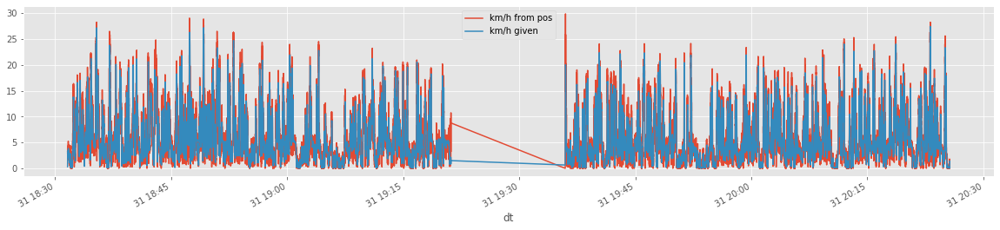

In [211]:
fig,ax = plt.subplots(figsize=(20,4))
df.set_index('dt_')['v[km/h]'].plot(ax=ax)
player_data.set_index('dt')['speed[km/h]'].plot(ax=ax)
# plt.plot(player_data['dt'],df['v[km/h]'])
plt.legend(['km/h from pos','km/h given'])



# s/v/a plots for a player starting from pos and speed respectively overlaid

In [219]:
# get raw data for a player
player_data = data.query('playerid=="01"')

# start with km/h given
# calc dis & acc
player_data['v[km/h]'] = player_data['speed[km/h]']

# v = km/h /3.6
player_data['v[m/s]'] = player_data['v[km/h]']/3.6
# s = ut(+0.5at2)
player_data['s[m]'] = player_data['v[m/s]']*0.1 # time taken is 100 ms = 0.1s
# a = (v-u)/t
player_data['a[m/s2]'] = player_data['v[m/s]'].diff()/0.1

# start with pos (m) given
# calc dis, vel, acc
player_data['dx'] = player_data['xPos[m]'].diff()
player_data['dy'] = player_data['yPos[m]'].diff()
player_data['s'] = player_data.apply(lambda row: np.sqrt(row.dx**2 + row.dy**2), axis=1) 
player_data['vx'] = player_data['dx']/0.1
player_data['vy'] = player_data['dy']/0.1
player_data['v'] = player_data.apply(lambda row: np.sqrt(row.vx**2 + row.vy**2), axis=1)
player_data['v[km/h]_'] = player_data['v']*3.6
player_data['ax'] = player_data['vx'].diff()/0.1
player_data['ay'] = player_data['vy'].diff()/0.1
player_data['a'] = player_data.apply(lambda row: np.sqrt(row.ax**2 + row.ay**2), axis=1) 

df = player_data[['t','s[m]','v[m/s]','v[km/h]','a[m/s2]','s','v','v[km/h]_','a']].set_index('t', drop=True)
df

,s[m],v[m/s],v[km/h],a[m/s2],s,v,v[km/h]_,a
t,,,,,,,,
2018-10-31 18:31:38.000,0.00894,0.0894,0.32184,NaN,NaN,NaN,NaN,NaN
2018-10-31 18:31:38.100,0.01750,0.1750,0.63000,0.856,0.089263,0.892634,3.213484,NaN
2018-10-31 18:31:38.200,0.02630,0.2630,0.94680,0.880,0.088931,0.889308,3.201508,0.769478
2018-10-31 18:31:38.300,0.03409,0.3409,1.22724,0.779,0.078194,0.781940,2.814984,1.351931
2018-10-31 18:31:38.400,0.04262,0.4262,1.53432,0.853,0.094107,0.941066,3.387837,2.562163
...,...,...,...,...,...,...,...,...
2018-10-31 20:25:38.600,0.03481,0.3481,1.25316,0.276,0.044436,0.444359,1.599692,1.351944
2018-10-31 20:25:38.700,0.03711,0.3711,1.33596,0.230,0.040047,0.400472,1.441700,1.111752
2018-10-31 20:25:38.800,0.03906,0.3906,1.40616,0.195,0.032724,0.327243,1.178075,0.769524


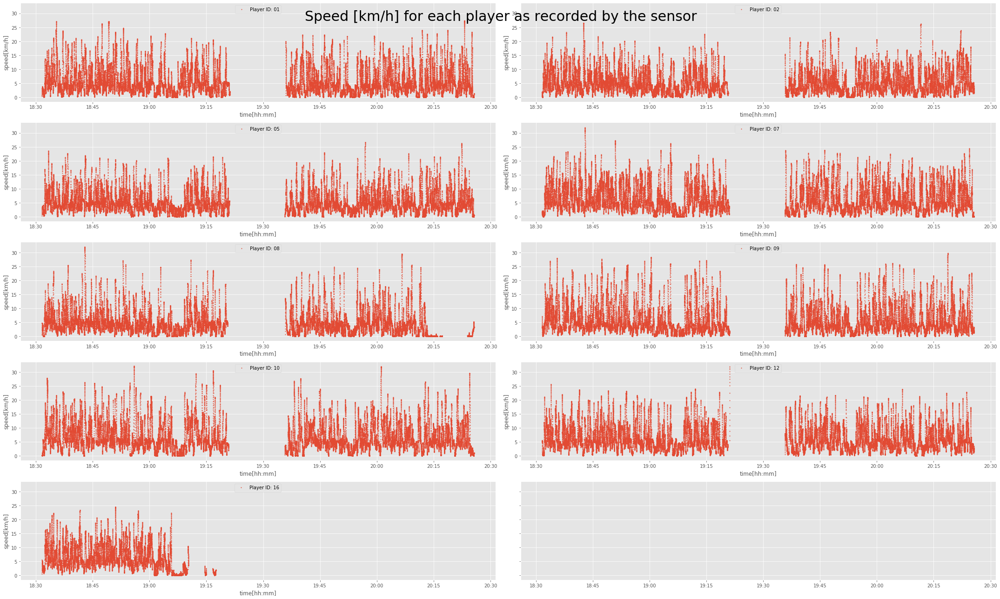

In [345]:
fig,axs = plt.subplots(nrows=5,ncols=2,figsize=(30,3*6), sharex=True, sharey=True)
plt.suptitle("Speed [km/h] for each player as recorded by the sensor", fontsize=30)
axs = axs.ravel()
for i,p in enumerate(player_ids):
    pdf = data.query('playerid==@p').set_index('datetime', drop=True)
    axs[i].plot(pdf.index, pdf['speed[km/h]'], 'o', ms=1);
    axs[i].xaxis.set_major_formatter(mdates.DateFormatter("%H:%M"))
    axs[i].xaxis.set_minor_formatter(mdates.DateFormatter("%H:%M"))
    axs[i].legend([f"Player ID: {p}"],loc='upper center')
    axs[i].set_xlabel('time[hh:mm]');
    axs[i].set_ylabel('speed[km/h]');  
    axs[i].xaxis.set_tick_params(which='both', labelbottom=True)
    axs[i].yaxis.set_tick_params(which='both',labelleft=True)
    

plt.tight_layout()


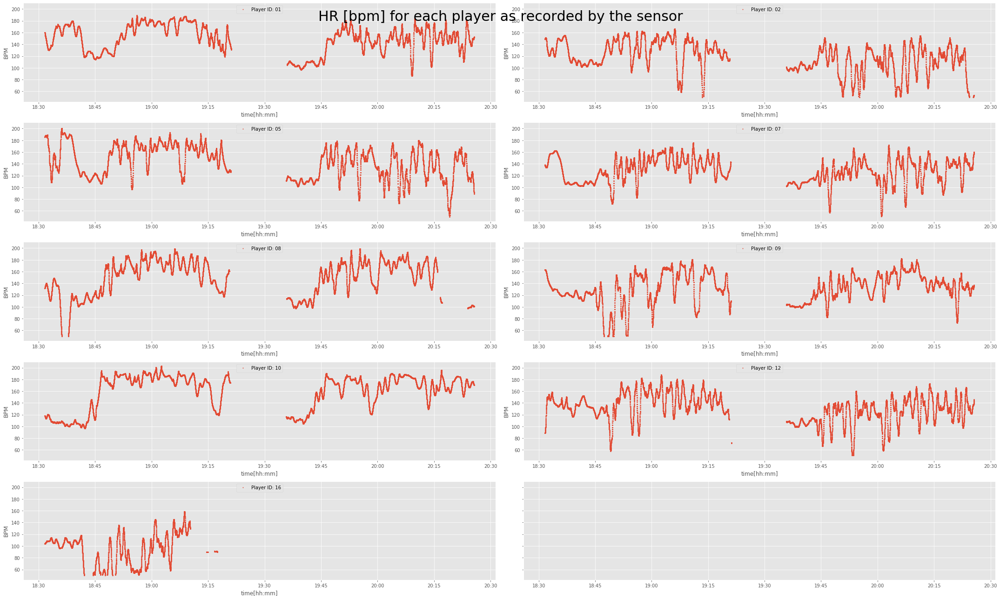

In [405]:
fig,axs = plt.subplots(nrows=5,ncols=2,figsize=(30,3*6), sharex=True, sharey=True)
plt.suptitle("HR [bpm] for each player as recorded by the sensor", fontsize=30)
axs = axs.ravel()
for i,p in enumerate(player_ids):
    pdf = data.query('playerid==@p').set_index('datetime', drop=True)
    axs[i].plot(pdf.index, pdf['hr[bpm]'], 'o', ms=1);
    axs[i].xaxis.set_major_formatter(mdates.DateFormatter("%H:%M"))
    axs[i].xaxis.set_minor_formatter(mdates.DateFormatter("%H:%M"))
    axs[i].legend([f"Player ID: {p}"],loc='upper center')
    axs[i].set_xlabel('time[hh:mm]');
    axs[i].set_ylabel('BPM');  
    axs[i].xaxis.set_tick_params(which='both', labelbottom=True)
    axs[i].yaxis.set_tick_params(which='both',labelleft=True)
    

plt.tight_layout()


In [420]:
pdf.shape[0]*0.1/60

39.516666666666666

In [422]:
# player | total time| dis tot| HI dis| dis in speed bins | #sprints | avg speed | max speed | max acc| # acc bins | max HR | avg HR | time in HR bins
player_aggs = pd.DataFrame()
for i,p in enumerate(player_ids):
    pdf = data.query('playerid==@p').set_index('datetime', drop=True)
    player_aggs.loc[i,'player_id'] = p
    
    x = (pdf.last_valid_index() - pdf.first_valid_index())
#     print (x)
#     player_aggs.loc[i,'time_played'] = datetime.time(x.seconds//3600,x.seconds//60//60,x.seconds%60)
    player_aggs.loc[i,'time_played'] = x.seconds/60
    
    pdf['s[m]'] = pdf['speed[km/h]']*0.1/3.6 # time taken is 100 ms = 0.1s
    player_aggs.loc[i,'Distance[km]'] = pdf['s[m]'].sum()/1000
    
    player_aggs.loc[i,'High_Intensity_Distance[km]'] = pdf.loc[pdf['speed[km/h]']>15,['s[m]']].values.sum()/1000
    player_aggs.loc[i,'Distance[km]_[0-15 km/h]'] = pdf.loc[pdf['speed[km/h]']<15,['s[m]']].values.sum()/1000
    player_aggs.loc[i,'Distance[km]_[15-20 km/h]'] = pdf.loc[pdf['speed[km/h]'].between(15, 19, inclusive = True),['s[m]']].values.sum()/1000
    player_aggs.loc[i,'Distance[km]_[20-25 km/h]'] = pdf.loc[pdf['speed[km/h]'].between(20, 24, inclusive = True),['s[m]']].values.sum()/1000
    player_aggs.loc[i,'Distance[km]_[25-20 km/h]'] = pdf.loc[pdf['speed[km/h]'].between(25, 30, inclusive = True),['s[m]']].values.sum()/1000
    player_aggs.loc[i,'Distance[km]_[30+ km/h]'] = pdf.loc[pdf['speed[km/h]']>30,['s[m]']].values.sum()/1000
    player_aggs.loc[i,'#sprints_[25+ km/h]'] = pdf.loc[pdf['speed[km/h]']>25].shape[0]
    
    player_aggs.loc[i,'Avg_Speed[km/h]'] = pdf['speed[km/h]'].mean()
    player_aggs.loc[i,'Max_Speed[km/h]'] = pdf['speed[km/h]'].max()
    
    pdf['a[m/s2]'] = (pdf['speed[km/h]']/3.6).diff()/0.1
    player_aggs.loc[i,'acc_max[m/s2]'] = pdf['a[m/s2]'].max()
    player_aggs.loc[i,'#acc>3m/s2'] =  pdf.loc[pdf['a[m/s2]']>3].shape[0]
    player_aggs.loc[i,'#acc>4m/s2'] =  pdf.loc[pdf['a[m/s2]']>4].shape[0]
    player_aggs.loc[i,'#dec>3m/s2'] =  pdf.loc[pdf['a[m/s2]']<-3].shape[0]
    player_aggs.loc[i,'#dec>4m/s2'] =  pdf.loc[pdf['a[m/s2]']<-4].shape[0]
    
    player_aggs.loc[i,'HR_min[bpm]'] = pdf['hr[bpm]'].min()
    player_aggs.loc[i,'HR_max[bpm]'] = pdf['hr[bpm]'].max()
    player_aggs.loc[i,'HR_mean[bpm]'] = pdf['hr[bpm]'].mean()
    
    # HR Zones 
#     player_aggs.loc[i,'mins_in_HR_Zone_1'] = pdf['hr[bpm]'].between(110, 131, inclusive = True).astype(int).sum()*0.1/60
#     player_aggs.loc[i,'mins_in_HR_Zone_2'] = pdf['hr[bpm]'].between(132, 153, inclusive = True).astype(int).sum()*0.1/60
#     player_aggs.loc[i,'mins_in_HR_Zone_3'] = pdf['hr[bpm]'].between(154, 175, inclusive = True).astype(int).sum()*0.1/60
#     player_aggs.loc[i,'mins_in_HR_Zone_4'] = pdf['hr[bpm]'].between(176, 197, inclusive = True).astype(int).sum()*0.1/60
#     player_aggs.loc[i,'mins_in_HR_Zone_5'] = pdf['hr[bpm]'].between(198, 219, inclusive = True).astype(int).sum()*0.1/60
    
#     Zone	    Intensity	Percentage of HRmax
#     Zone 1	Very light	50–60%
#     Zone 2	Light	    60–70%
#     Zone 3	Moderate	70–80%
#     Zone 4	Hard	    80–90%
#     Zone 5	Maximum	    90–100%
    
    player_aggs.loc[i,'mins_in_HR_Zone_1'] = pdf['hr[bpm]'].between(pdf['hr[bpm]'].max()*0.5, pdf['hr[bpm]'].max()*0.6, inclusive = True).astype(int).sum()*0.1/60
    player_aggs.loc[i,'mins_in_HR_Zone_2'] = pdf['hr[bpm]'].between(pdf['hr[bpm]'].max()*0.6, pdf['hr[bpm]'].max()*0.7, inclusive = True).astype(int).sum()*0.1/60
    player_aggs.loc[i,'mins_in_HR_Zone_3'] = pdf['hr[bpm]'].between(pdf['hr[bpm]'].max()*0.7, pdf['hr[bpm]'].max()*0.8, inclusive = True).astype(int).sum()*0.1/60
    player_aggs.loc[i,'mins_in_HR_Zone_4'] = pdf['hr[bpm]'].between(pdf['hr[bpm]'].max()*0.8, pdf['hr[bpm]'].max()*0.9, inclusive = True).astype(int).sum()*0.1/60
    player_aggs.loc[i,'mins_in_HR_Zone_5'] = pdf['hr[bpm]'].between(pdf['hr[bpm]'].max()*0.9, pdf['hr[bpm]'].max(), inclusive = True).astype(int).sum()*0.1/60
    
    
    
    
player_aggs.T

,0,1,2,3,4,5,6,7,8
player_id,01,02,05,07,08,09,10,12,16
time_played,114.017,114.017,114.017,114.017,114.017,114.017,114.017,114.017,45.85
Distance[km],9.95995,9.24155,9.26056,11.1831,7.62179,10.0394,11.6811,10.7343,4.25721
High_Intensity_Distance[km],1.91475,0.860034,1.08098,1.97928,1.16452,2.23124,2.42866,1.63566,0.532379
Distance[km]_[0-15 km/h],8.0452,8.38151,8.17958,9.20378,6.45727,7.80814,9.25248,9.09861,3.72483
Distance[km]_[15-20 km/h],1.25714,0.611903,0.768896,1.39535,0.637558,1.05997,1.26812,1.13342,0.388589
Distance[km]_[20-25 km/h],0.370862,0.137904,0.190245,0.336197,0.27135,0.675407,0.558902,0.318482,0.0953334
Distance[km]_[25-20 km/h],0.0761412,0.0223686,0.0208018,0.0449657,0.0771562,0.178348,0.223529,0.00731885,0
Distance[km]_[30+ km/h],0,0,0,0.0189779,0.0217027,0,0.0546213,0.00346282,0
#sprints_[25+ km/h],104,31,29,83,129,244,364,14,0


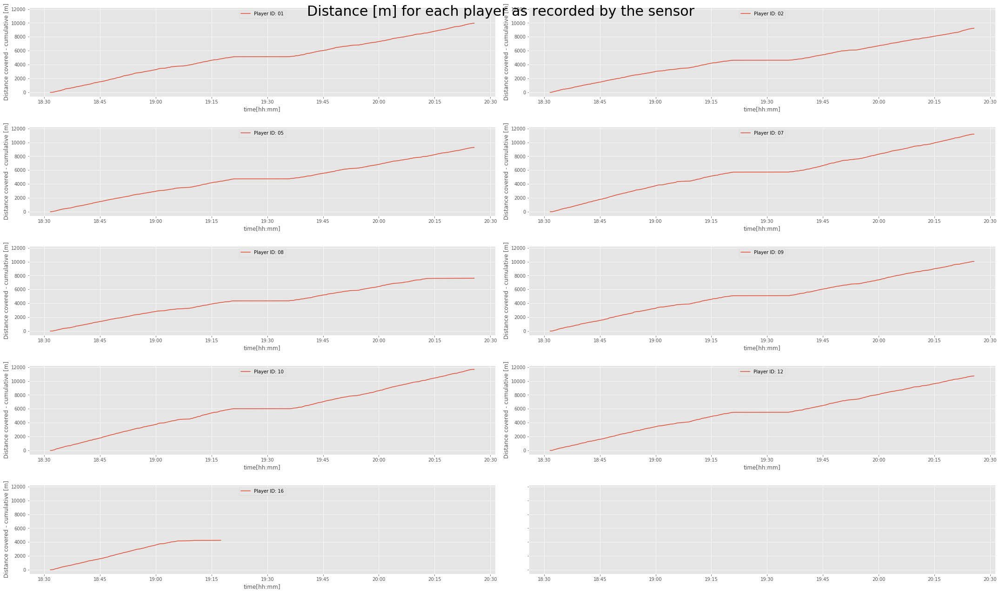

In [349]:
fig,axs = plt.subplots(nrows=5,ncols=2,figsize=(30,3*6), sharex=True, sharey=True)
plt.suptitle("Distance [m] for each player as recorded by the sensor", fontsize=30)
axs = axs.ravel()
for i,p in enumerate(player_ids):
    pdf = data.query('playerid==@p').set_index('datetime', drop=True)
    pdf['s[m]'] = pdf['speed[km/h]']*0.1/3.6 # time taken is 100 ms = 0.1s
    axs[i].plot(pdf.index, pdf['s[m]'].cumsum(), '-', ms=1);
    axs[i].xaxis.set_major_formatter(mdates.DateFormatter("%H:%M"))
    axs[i].xaxis.set_minor_formatter(mdates.DateFormatter("%H:%M"))
    axs[i].legend([f"Player ID: {p}"],loc='upper center')
    axs[i].set_xlabel('time[hh:mm]');
    axs[i].set_ylabel('Distance covered - cumulative [m]');  
    axs[i].xaxis.set_tick_params(which='both', labelbottom=True)
    axs[i].yaxis.set_tick_params(which='both',labelleft=True)
    

fig.tight_layout()


Text(0.5, 1.0, 'Acceleration[m/s2]')

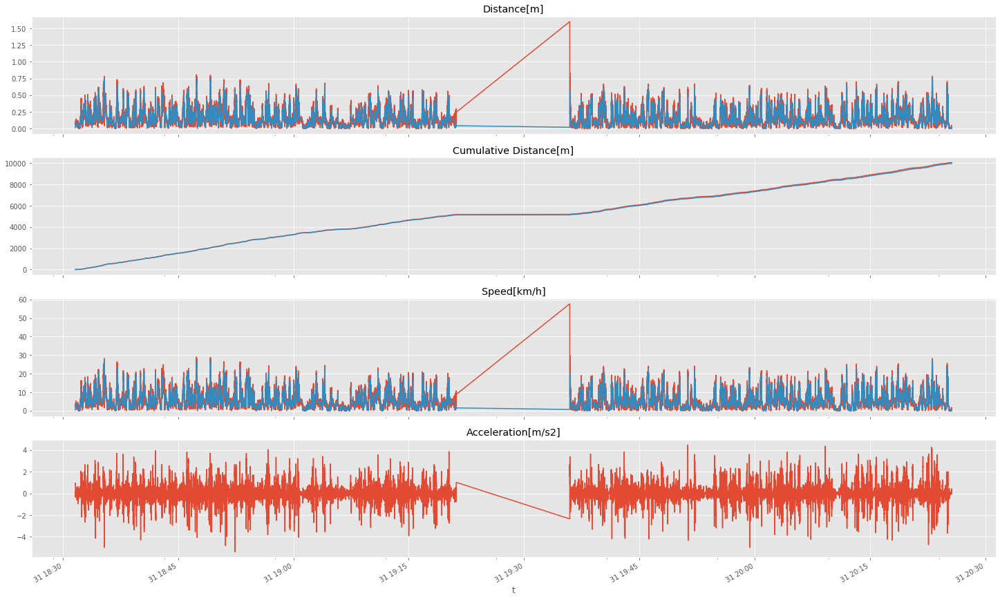

In [239]:
fig, axs = plt.subplots(nrows=4, ncols=1, figsize=(25, 16), sharex=True)
axs = axs.ravel()

df["s"].plot(ax=axs[0])
df["s[m]"].plot(ax=axs[0])
# axs[0].legend(["Calculated from xPos/yPos", "Calculated from speed[km/h]"])
axs[0].set_title("Distance[m]")

df["s"].cumsum().plot(ax=axs[1])
df["s[m]"].cumsum().plot(ax=axs[1])
# axs[1].legend(["Calculated from xPos/yPos", "Calculated from speed[km/h]"])
axs[1].set_title("Cumulative Distance[m]")

df["v[km/h]_"].plot(ax=axs[2])
df["v[km/h]"].plot(ax=axs[2])
# axs[2].legend(["Calculated from xPos/yPos", "Calculated from speed[km/h]"])
axs[2].set_title("Speed[km/h]")

# df['a'].plot(ax=axs[3])
df["a[m/s2]"].plot(ax=axs[3])
# axs[3].legend(["Calculated from xPos/yPos", "Calculated from speed[km/h]"])
axs[3].set_title("Acceleration[m/s2]")


# plot the activity on football pitch

In [11]:

!pip freeze | grep 'plot'
!which python

matplotlib==3.3.3
plotly==4.13.0
/mnt/d/xFootball/JCI/jci_iot/.env/bin/python


In [9]:
import plotly.graph_objects as go
import plotly.figure_factory as ff
from collections import namedtuple

In [10]:
# PITCH VIZ PARAMS
FIELD_WIDTH=1000
FIELD_HEIGHT=700
FIELD_DIM = (118.0, 72.0)

FIELD_COLOR = 'mediumseagreen'
FIELD_MARKINGS_COLOR = 'White'

# FIELD_COLOR = 'White'
# FIELD_MARKINGS_COLOR = 'black'

In [49]:
def generate_pitch_layout(tracking_frames=None, field_dimen=FIELD_DIM):
    # decide what color we want the field to be. Default is green, but can also choose white
    #     if field_color=='green':
    #         ax.set_facecolor('mediumseagreen')
    #         lc = 'whitesmoke' # line color
    #         pc = 'w' # 'spot' colors
    #     elif field_color=='white':
    #         lc = 'k'
    #         pc = 'k'
    # ALL DIMENSIONS IN m
    border_dimen = (3, 3)  # include a border arround of the field of width 3m
    meters_per_yard = 0.9144  # unit conversion from yards to meters
    half_pitch_length = field_dimen[0]/2.  # length of half pitch
    half_pitch_width = field_dimen[1]/2.  # width of half pitch
    signs = [-1, 1]
    # Soccer field dimensions typically defined in yards, so we need to convert to meters
    goal_line_width = 8*meters_per_yard
    box_width = 20*meters_per_yard
    box_length = 6*meters_per_yard
    area_width = 44*meters_per_yard
    area_length = 18*meters_per_yard
    penalty_spot = 12*meters_per_yard
    corner_radius = 1*meters_per_yard
    D_length = 8*meters_per_yard
    D_radius = 10*meters_per_yard
    D_pos = 12*meters_per_yard
    centre_circle_radius = 10*meters_per_yard

    point = namedtuple('point', ['x', 'y'])
    centre = point(half_pitch_length, half_pitch_width)

    shapes = []

    mid_circle = dict(type="circle", 
                      x0=centre.x - centre_circle_radius, y0=centre.y - centre_circle_radius,
                      x1=centre.x + centre_circle_radius, y1=centre.y + centre_circle_radius, 
                      line_color=FIELD_MARKINGS_COLOR, layer="below")
    mid_line = dict(type="line",
                    x0=centre.x, y0=centre.y - half_pitch_width,
                    x1=centre.x, y1=centre.y + half_pitch_width, line_color=FIELD_MARKINGS_COLOR, layer="below")
    mid_point = dict(type="circle",
                     x0=centre.x-0.4, y0=centre.y-0.4,
                     x1=centre.x+0.4, y1=centre.y+0.4, line_color=FIELD_MARKINGS_COLOR, fillcolor=FIELD_MARKINGS_COLOR, layer="below")
    shapes.extend([mid_circle, mid_line, mid_point])

    for s in signs:

        # plot pitch boundary
        boundary1 = dict(type="line",
                         x0=centre.x-half_pitch_length, y0=centre.y+s*half_pitch_width,
                         x1=centre.x+half_pitch_length, y1=centre.y+s*half_pitch_width, line_color=FIELD_MARKINGS_COLOR, layer="below")

        boundary2 = dict(type="line",
                         x0=centre.x+s*half_pitch_length, y0=centre.y-half_pitch_width,
                         x1=centre.x+s*half_pitch_length, y1=centre.y+half_pitch_width, line_color=FIELD_MARKINGS_COLOR, layer="below")

        circle = dict(type="circle",
                        x0=centre.x+s*(half_pitch_length-penalty_spot) - centre_circle_radius,
                        y0=centre.y - centre_circle_radius,
                        x1=centre.x+s*(half_pitch_length-penalty_spot) + centre_circle_radius, 
                        y1=centre.y + centre_circle_radius, line_color=FIELD_MARKINGS_COLOR, layer="below")

        patch = dict(type="rect",
                     x0=centre.x+s*half_pitch_length, y0=centre.y-area_width/2. - 1,
                     x1=centre.x+s*(half_pitch_length - area_length), y1=centre.y+area_width/2. + 1, 
                     line=dict(color=FIELD_COLOR, width=0), fillcolor=FIELD_COLOR, layer="below")

        box = dict(type="rect",
                   x0=centre.x+s*half_pitch_length, y0=centre.y-area_width/2.,
                   x1=centre.x+s*(half_pitch_length - area_length), y1=centre.y+area_width/2., 
                   line=dict(color=FIELD_MARKINGS_COLOR, width=2), layer="below")
        
        D = dict(type="rect",
                 x0=centre.x+s*half_pitch_length, y0=centre.y-box_width/2.,
                 x1=centre.x+s*(half_pitch_length - box_length), y1=centre.y+box_width/2., 
                 line=dict(color=FIELD_MARKINGS_COLOR, width=2), layer="below")
        
        pen = dict(type="circle",
                   x0=centre.x+s*(half_pitch_length - penalty_spot)-0.4, y0=centre.y-0.4,
                   x1=centre.x+s*(half_pitch_length - penalty_spot)+0.4, y1=centre.y+0.4, 
                   line_color=FIELD_MARKINGS_COLOR, fillcolor=FIELD_MARKINGS_COLOR, layer="below")

        top_post = dict(type="rect",
                        x0=centre.x+s*half_pitch_length, y0=centre.y+goal_line_width/2. - 0.5,
                        x1=centre.x+s*(half_pitch_length-0.5), y1=centre.y+goal_line_width/2.+0.5,
                        line=dict(color=FIELD_MARKINGS_COLOR, width=0), fillcolor=FIELD_MARKINGS_COLOR, layer="below")

        bottom_post = dict(type="rect",
                           x0=centre.x+s*half_pitch_length, y0=centre.y-goal_line_width/2. - 0.5,
                           x1=centre.x+s*(half_pitch_length-0.5), y1=centre.y-goal_line_width/2.+0.5, 
                           line=dict(color=FIELD_MARKINGS_COLOR, width=0), fillcolor=FIELD_MARKINGS_COLOR, layer="below")

        shapes.extend([boundary1, boundary2, circle, patch,
                       box, D, pen, top_post, bottom_post])

    print(len(tracking_frames), '<------here')
    sliders_dict = {
        "active": 0,
        #     "yanchor": "top",
        #     "xanchor": "left",
        "currentvalue": {
            "font": {"size": 20},
            "prefix": "Frame:",
            "visible": True,
            "xanchor": "right"
        },
        #     "transition": {"duration": 300, "easing": "cubic-in-out"},
        "pad": {"b": 10, "t": 50},
        #     "len": 0.9,
        #     "x": 0.1,
        #     "y": 0,
        "steps": []
    }

    for frame_num in tracking_frames:
        slider_step = {"args": [
            [frame_num],
            {"frame": {"duration": 300, "redraw": False},
                "mode": "immediate",
                "transition": {"duration": 10, "easing": "linear"}
                }
        ],
            "label": str(frame_num),
            "method": "animate"
        }
        sliders_dict["steps"].append(slider_step)

    updatemenus = {
        "buttons": [
            {
                "args": [None, {"frame": {"duration": 10, "redraw": False},
                                "fromcurrent": True,
                                "mode": "immediate",
                                "transition": {"duration": 10,
                                               "easing": "linear"
                                               }}],
                "label": ">",
                "method": "animate"
            },
            {
                "args": [[None], {"frame": {"duration": 10, "redraw": False},
                                  "mode": "immediate",
                                  "transition": {"duration": 10}}],
                "label": "||",
                "method": "animate"
            }
        ],
        "direction": "left",
        # "pad": {"r": 40, "t": 50},
        "showactive": False,
        "type": "buttons",
        "xanchor": "right",
        "yanchor": "top",
        "x": 0.1,
        "y": 0.02,
    }

    # set axis limits
    xmax = field_dimen[0] + border_dimen[0]
    ymax = field_dimen[1] + border_dimen[1]

    layout = go.Layout(
        # title='Goal: {}'.format(LIV_GOALS[MATCH]['PLAY']),
        hovermode='closest',
        autosize=True,
        width=FIELD_WIDTH,
        height=FIELD_HEIGHT,
        plot_bgcolor=FIELD_COLOR,
        xaxis=go.layout.XAxis(
            range=[0, xmax],
            showgrid=False, zeroline=False,
            showticklabels=False,
            visible=False
        ),
        yaxis=go.layout.YAxis(
            range=[0, ymax],
            showgrid=False, zeroline=False,
            showticklabels=False,
            visible=False,
            scaleanchor="x",
            scaleratio=1,
        ),
        margin=go.layout.Margin(
            l=0,
            r=0,
            b=0,
            t=0,
            pad=0
        ),
        legend = dict(x=0.2, y=0.03, orientation="h")
    )

    layout["shapes"] = shapes
    layout["sliders"] = [sliders_dict]
    layout["updatemenus"] = [updatemenus]

    return layout



In [12]:
PLAYERMARKERSIZE = 20
player_marker_args = {'Home': dict(mode='markers+text',
                                   marker_size=PLAYERMARKERSIZE,
                                   marker_line_color="white",
                                   marker_color="red",
                                   marker_line_width=2,
                                   textfont=dict(
                                        size=11,
                                        color="white"
                                   )),
                      'Away': dict(mode='markers+text',
                                   marker_size=PLAYERMARKERSIZE,
                                   marker_line_color="white",
                                   marker_color="#0570b0",
                                   marker_line_width=2,
                                   textfont=dict(
                                        size=11,
                                        color="white"
                                   ))}
side='Home'

In [127]:
def generate_data_for_frame(data, frame_num, player_num=None):

    traces_ = []

    # position_traces = []
    player_nums = data.playerid.unique()
    xlocs = data.loc[data.t==frame_num,'xPos[m]'].tolist()
    ylocs = data.loc[data.t==frame_num,'yPos[m]'].tolist()

    traces = dict(x=xlocs, y=ylocs, text=player_nums,**player_marker_args[side], name=side)
    print (type(traces))
    # position_traces.append(traces)

    # traces_.append(traces)

    # if hometeam['ball_x']:
    #     traces.extend(plot_ball(tracking_data))

    # data_ = traces_
    # print(data_)
    return traces

In [121]:
def generate_plotly_frames_for_event(data, tracking_frames, player_num=None):
    frames = []
    frame = {"data": [],
                 #  'traces': [0],
                 "name": str(frame_num)}
    for frame_num in tqdm(tracking_frames):  # [::25]:
        # frame_num = str(frame_num)
        
        frame["data"].append(generate_data_for_frame(data,frame_num=frame_num, player_num=player_num))
        print (len(frame['data']))
        frames.append(frame)
    print (len(frames[0]['data']))
    return frames

In [126]:
tracking_frames = data.query('playerid=="01"')['t'].values[:5]

event_start_frame = tracking_frames[0]
# make figure
fig_dict = {
    "data": [],
    "layout": {},
    "frames": []
}
fig_dict['layout'] = generate_pitch_layout(
    tracking_frames)
fig_dict['data'] = generate_data_for_frame(data,frame_num=event_start_frame)
fig_dict['frames'] = generate_plotly_frames_for_event(data,tracking_frames)

fig = go.Figure(fig_dict)

fig.show()

5 <------here
<class 'dict'>


<class 'dict'>
1
<class 'dict'>
1
<class 'dict'>
1
<class 'dict'>
1
<class 'dict'>
1

1


In [26]:
# make data
timestamp = 111 #year = 1952
for player in player_ids:
    dataset_by_timestamp = dataset[dataset["timestamp"] == timestamp]
    dataset_by_timestamp_and_player = dataset_by_timestamp[
        dataset_by_timestamp["player"] == player]

    data_dict = {
        "x": list(dataset_by_timestamp_and_player["xPos"]),
        "y": list(dataset_by_timestamp_and_player["yPos"]),
        "mode": "markers",
        "text": list(dataset_by_timestamp_and_player["player"]),
        "marker": {
            "sizemode": "area",
            "sizeref": 200000,
            "size": 20 #list(dataset_by_timestamp_and_player["pop"])
        },
        "name": player
    }
    fig_dict["data"].append(data_dict)


In [13]:
data.head()

,time[ISO-UTC],xPos[m],yPos[m],Latitude[deg],Longitude[deg],speed[km/h],hr[bpm],numSatFix[-],hdop[-],playerid,datetime,t
0,20181031T183138000,45.187631,26.145418,46.371289,6.22868,0.32184,160.0578,NaN,NaN,01,2018-10-31 18:31:38.000,18:31:38
1,20181031T183138100,45.112052,26.097923,46.371288,6.22868,0.63000,160.0578,NaN,NaN,01,2018-10-31 18:31:38.100,18:31:38.100000
2,20181031T183138200,45.032956,26.057272,46.371287,6.22868,0.94680,160.0578,NaN,NaN,01,2018-10-31 18:31:38.200,18:31:38.200000
3,20181031T183138300,44.967264,26.014859,46.371286,6.22868,1.22724,160.0578,NaN,NaN,01,2018-10-31 18:31:38.300,18:31:38.300000
4,20181031T183138400,44.902237,25.946833,46.371285,6.22868,1.53432,160.0578,NaN,NaN,01,2018-10-31 18:31:38.400,18:31:38.400000


In [51]:
# make figure
fig_dict = {
    "data": [],
    "layout": {},
    "frames": []
}

# make data
timestamp = data['t'].iloc[0]
players = data.playerid.unique()
for player in players:
    dataset_by_timestamp = data[data["t"] == timestamp]
    dataset_by_timestamp_and_player = dataset_by_timestamp[
        dataset_by_timestamp["playerid"] == player]

    data_dict = {
        "x": list(dataset_by_timestamp_and_player["xPos[m]"]),
        "y": list(dataset_by_timestamp_and_player["yPos[m]"]),
        "mode": "markers",
        "text": player,
        # "marker": {
        #     "sizemode": "area",
        #     "sizeref": 200000,
        #     "size": list(dataset_by_year_and_cont["pop"])
        # },
        "name": player,
        
    }
    data_dict.update(dict(mode='markers+text',
                                   marker_size=PLAYERMARKERSIZE,
                                   marker_line_color="white",
                                   marker_color="red",
                                   marker_line_width=2,
                                   textfont=dict(
                                        size=11,
                                        color="white"
                                   )))
    
    
    fig_dict["data"].append(data_dict)


# make frames
timestamps = data.query('playerid=="01"')['t'].values[:1000]
for timestamp in tqdm(timestamps):
    frame = {"data": [], "name": str(timestamp)}
    for player in players:
        dataset_by_timestamp = data[data["t"] == timestamp]
        dataset_by_timestamp_and_player = dataset_by_timestamp[
            dataset_by_timestamp["playerid"] == player]

        data_dict = {
            "x": list(dataset_by_timestamp_and_player["xPos[m]"]),
            "y": list(dataset_by_timestamp_and_player["yPos[m]"]),
            "mode": "markers",
            "text": player,
            # "marker": {
            #     "sizemode": "area",
            #     "sizeref": 200000,
            #     "size": list(dataset_by_year_and_cont["pop"])
            # },
            "name": player
        }
        data_dict.update(dict(mode='markers+text',
                                   marker_size=PLAYERMARKERSIZE,
                                   marker_line_color="white",
                                   marker_color="red",
                                   marker_line_width=2,
                                   textfont=dict(
                                        size=11,
                                        color="white"
                                   )))
        frame["data"].append(data_dict)

    fig_dict["frames"].append(frame)
#     slider_step = {"args": [
#         [timestamp],
#         {"frame": {"duration": 300, "redraw": False},
#          "mode": "immediate",
#          "transition": {"duration": 300}}
#     ],
#         "label": str(timestamp),
#         "method": "animate"}
#     sliders_dict["steps"].append(slider_step)

# fig_dict["layout"]["sliders"] = [sliders_dict]

fig_dict['layout'] = generate_pitch_layout(timestamps)
fig = go.Figure(fig_dict)

fname = '../datahub/lastrow/{}_fig_dict_white.pickle'.format(
        LIV_GOALS[MATCH]['PLAY'])

with open(fname, 'wb') as handle:
    cloudpickle.dump(fig_dict, handle,
                     protocol=cloudpickle.DEFAULT_PROTOCOL)
    handle.close()

fig.show()


1000 <------here


In [36]:
# data[data.playerid=='01'][['xPos[m]','yPos[m]']].plot()
x = data.loc[data.playerid=='01','xPos[m]'].values[:10000]
y = data.loc[data.playerid=='01','yPos[m]'].values[:10000]
fig = go.Figure(data=go.Scatter(x=x, y=y, mode='markers'))
fig.update_xaxes(range=[0, 118])
fig.update_yaxes(range=[0, 72])
fig.show()

### Refer for practical limits
https://barcainnovationhub.com/high-intensity-accelerations-soccer/  
https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0216806